In [1]:
## Ukiyo-Neko Systems
### least squares module

import numpy as np
### least squares function description
## we are given a data set D consisting of pairs of points (x,y)
## first entry is assumed to be independent variable x
## second entry assumed to be dependent variable y
## the shape of D is =[[a,b],[c,d],..,[y,z]]

## the implementation requires data to be separated by variable into vectors
## thus vectorify takes a dataset like
## D = [[x1,y1],[x2,y2],[x3,y3]..]
## and takes it to vectorify(D)=[[x1,x2,x3],[y1,y2,y3]]

def vectorify(datavec):
    xes=[]
    yes=[]
    for i in datavec:
        xes.append(i[0])
        yes.append(i[1])
    return([xes,yes])

## least squares takes the result of vectorify on the specified dataset D

def leastSquares(dvec):
    x= dvec[0]
    y = dvec[1]
    N = len(x)
    v1= np.ones(N)
    mnumerador =    N* np.dot(x,y)-(np.dot(v1,x)*np.dot(v1,y))
    mdenominador = N* np.dot(x,x)-(np.dot(v1,x)*np.dot(v1,x))
    m=mnumerador/mdenominador
    b= (np.dot(v1,y) - m *np.dot(v1,x))/N
    return [m,b]

In [2]:
D=[[1,2,3],[2,4,6]]
leastSquares(D)[0]

2.0

In [3]:
## Ukiyo neko systems                                                                                                                       
## usando matplotlib para yegraficar datos bidimensionales                                                                                  
import matplotlib.pyplot as plt
import numpy as np

## aqui van los datos                                                                                                                       

#xes = [2,4,6,8]                                                                                                                            
#yes = [0.9,0.72,0.54,0.5] # 3V                                                                                                             
#yes = [0.24,0.18,0.16,0.13] # 6V                                                                                                           
#yes = [0.42,0.33,0.26,0.22] # 9V                                                                                                           
#yes = [0.57,0.44,0.35,0.30] # 12V                                                                                                          
#yes = [0.74,0.55,0.44,0.38] # 15V                                                                                                          


def graficaDatos(xes, yes,incertx,incerty, xlabel, ylabel, titulo):

## xes -> variable independiente
## yes -> variable dependiente
## incertx -> incertidumbre var indep
## incerty -> incertidumbre var dep
## xlabel -> lo que dice en la variable independiente
## ylabel -> lo mismo pero para la dependiente
## titulo -> ??


## usamos un poco de automagia para autodeterminar los limites de                                                                           
## la grafica                                                                                                                               
# eje x                                                                                                                                     
    xprincipio=min(xes)
    xfin=max(xes)
    xintervalo = xfin-xprincipio
    xescalar = xintervalo/15 # el numero por que multiplicamos intervalo cambia que tanto                                                   
    #espacio blanco dejamos a las esquinas                                                                                                  
    # eje y                                                                                                                                 
    yprincipio=min(yes)
    yfin= max(yes)
    yintervalo=yfin-yprincipio
    yescalar = yintervalo/15
    
    ## ajustamos los limites de la grafica automagicamente                                                                                  
    plt.axis([xprincipio-xescalar-incertx, xfin+xescalar+incertx, yprincipio-yescalar-incerty, yfin+yescalar+incerty])


    plt.grid(True)
    ## titulo, y esas cosas                                                                                                                 
    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    ## linea autoajustada
    ajuste = leastSquares([xes,yes])
    pendiente = ajuste[0]
    ordenada = ajuste[1]
    
    plt.plot(xes, np.multiply(pendiente,xes) + ajuste[1], label='y='+str(ajuste[0])+'*x+'+str(ajuste[1]))
 
    ## texto flotante
    posx= xfin+xescalar+incertx-(xprincipio-xescalar-incertx) # toda la graf en x 
    posx *= 0.05 ## la encogemos una proporcion chica
    posx += xprincipio-xescalar-incertx  ## le sumamos el minimo en x
    
    posy= yfin+yescalar+incerty-(yprincipio-yescalar-incerty) # toda la graf en y
    posy *=0.05
    posy += yprincipio-yescalar-incerty
    
    texto = f'fit(x)={ajuste[0]:.2f}x+{ajuste[1]:.2f}'
    plt.text(posx, posy, texto, style='italic',bbox={'facecolor':'white', 'alpha':0.5, 'pad':10})

    
    ## finalmente hacemos la grafica                                                                                                        
    plt.errorbar(xes,yes, xerr=incertx, yerr=incerty, fmt='ro')
    #plt.legend(loc='best')
    plt.show()
    # print (fit)



In [4]:
#plt.errorbar?

In [5]:
np.multiply([4],[1,2])

array([4, 8])

In [6]:
## Ukiyo neko systems                                                                                                                       
## usando matplotlib para yegraficar datos bidimensionales                                                                                  
import matplotlib.pyplot as plt
import numpy as np

## aqui van los datos                                                                                                                       

#xes = [2,4,6,8]                                                                                                                            
#yes = [0.9,0.72,0.54,0.5] # 3V                                                                                                             
#yes = [0.24,0.18,0.16,0.13] # 6V                                                                                                           
#yes = [0.42,0.33,0.26,0.22] # 9V                                                                                                           
#yes = [0.57,0.44,0.35,0.30] # 12V                                                                                                          
#yes = [0.74,0.55,0.44,0.38] # 15V                                                                                                          


def graficaEspacio(xes, yes,incertx,incerty, xlabel, ylabel, titulo):

## xes -> variable independiente
## yes -> variable dependiente
## incertx -> incertidumbre var indep
## incerty -> incertidumbre var dep
## indiceImpulso -> elemento de la serie de tiempo en que se imprime el impulso sobre la masa (recuerda que los indices empiezan en 0)


## usamos un poco de automagia para autodeterminar los limites de                                                                           
## la grafica                                                                                                                               
# eje x                                                                                                                                     
    xprincipio=min(xes)
    xfin=max(xes)
    xintervalo = xfin-xprincipio
    xescalar = xintervalo/15 # el numero por que multiplicamos intervalo cambia que tanto                                                   
    #espacio blanco dejamos a las esquinas                                                                                                  
    # eje y                                                                                                                                 
    yprincipio=min(yes)
    yfin= max(yes)
    yintervalo=yfin-yprincipio
    yescalar = yintervalo/15
    
    ## ajustamos los limites de la grafica automagicamente                                                                                  
    plt.axis([xprincipio-xescalar-incertx, xfin+xescalar+incertx, yprincipio-xescalar-incerty, yfin+xescalar+incerty])

    plt.grid(True)
    ## titulo, y esas cosas                                                                                                                 
    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

## linea autoajustada
#    fit = np.polyfit(xes,yes,1)
#    linea = np.poly1d(fit)
#    plt.plot(xes, linea(xes), label='y='+str(fit[0])+'*x+'+str(fit[1]))
 

    
    ## finalmente hacemos la grafica                                                                                                        
    plt.errorbar(xes,yes, xerr=incertx, yerr=incerty, fmt='ro')
    #plt.legend(loc='best')
    plt.show()
    # print (fit)



In [7]:
## queremos un graficador que pueda graficar incertidumbres que cambian con cada datapoint

def graficaIncertRelativas(xes, yes,incertx,incerty, xlabel, ylabel, titulo):

## xes -> variable independiente
## yes -> variable dependiente
## incertx -> incertidumbre var indep se asume incertidumbre absoluta (si es constante ponga un vector constante)
## incerty -> incertidumbre var dep (un vector del mismo tamanio que yes) (se asume incertidumbre relaiva)


## usamos un poco de automagia para autodeterminar los limites de                                                                           
## la grafica                                                                                                                               
# eje x                                                                                                                                     
    xprincipio=min(xes)
    xfin=max(xes)
    xintervalo = xfin-xprincipio
    xescalar = xintervalo/15 # el numero por que multiplicamos intervalo cambia que tanto                                                   
    #espacio blanco dejamos a las esquinas                                                                                                  
    # eje y                                                                                                                                 
    yprincipio=min(yes)
    yfin= max(yes)
    yintervalo=yfin-yprincipio
    yescalar = yintervalo/1
    
    
    ## para encontrar la incertidumbre mas grande, tenemos que multiplicar la incertidumbre relativa por la medida
    foo=abs(np.multiply(yes, incerty))
    
    if type(incertx) == float:
        bar=[]
        for i in range(len(foo)):
            bar.append(incertx)
    else:
        bar=incertx
    
    
    
    ## ajustamos los limites de la grafica automagicamente                                                                                  
    plt.axis([xprincipio-xescalar-max(incertx), xfin+xescalar+max(incertx), yprincipio-yescalar-max(incerty), yfin+yescalar+max(incerty)])

    plt.grid(True)
    ## titulo, y esas cosas                                                                                                                 
    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

## linea autoajustada
#    fit = np.polyfit(xes,yes,1)
#    linea = np.poly1d(fit)
#    plt.plot(xes, linea(xes), label='y='+str(fit[0])+'*x+'+str(fit[1]))
 

    
    ## finalmente hacemos la grafica                                                                                                        
    plt.errorbar(xes,yes, xerr=incertx, yerr=foo, fmt='b.',capsize=2, ecolor='orange')
    #plt.legend(loc='best')
    plt.show()
    # print (fit)



In [8]:
## velocity calculator
## given a vector of dependent variables and one of independent variables
## return a velocity vector 
## observe that to acquire a velocity we need two points to compare. thus the first and last elements of the 
## vector are problematic, therefore, given a n length vector, we return a n-2 length vector
## note that the velocity obtained by this is only good if the independent variable step is small


## velocity (independent var, dependent var)
## ie velocity(x, x^2) or something like that

def velocity(xes,yes):
    vels = []
    for i in range(1,len(xes)-1):
        if xes[i]-xes[i-1] != 0:
            v = (yes[i] - yes[i-1])/(xes[i]-xes[i-1])
            vels.append(v)
        else:
            v = 0
            vels.append(v)

    return(vels)

In [9]:
## we want to write velocity uncertainty
## given a velocity measurement, we return a 2 vector encoding
## the velocity measurement and the relative uncertainty
## xes es variable independiente (longitud, tiempo ets)
## yes es variable dependiente (volumen, velocidad, ect)
def veluncert(xes,yes,ix,iy):
    vels = []
    dvels=[]
    for i in range(1,len(xes)-1):
        if xes[i]-xes[i-1] != 0:
            dt= xes[i]-xes[i-1]
            dx = yes[i]-yes[i-1]
            v = dx/dt
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix)/abs(dt)
            dv += (2*iy)/abs(dx)
            dvels.append(dv)
        else:
            v = 0
            vels.append(v)
            dvels.append(0)

    return([vels,dvels])
    

In [10]:
## we want to write velocity uncertainty
## given a velocity measurement, we return a 2 vector encoding
## the velocity measurement and the relative uncertainty
## xes es variable independiente (longitud, tiempo ets)
## yes es variable dependiente (volumen, velocidad, ect)
##ix is vector of uncertanties
## same iy

def veluncertvec(xes,yes,ix,iy):
    vels = []
    dvels=[]
    for i in range(1,len(xes)-1):
        if xes[i]-xes[i-1] != 0:
            dt= xes[i]-xes[i-1]
            dx = yes[i]-yes[i-1]
            v = dx/dt
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[i])/abs(dt)
            dv += (2*iy[i])/abs(dx)
            dvels.append(dv)
        else:
            v = 0
            vels.append(v)
            dvels.append(0)

    return([vels,dvels])
    

In [11]:
## diferencias finitas centradas (se usa en interior de un datavec)
def veluncertvec3(xes,yes,ix,iy):
    vels = []
    dvels=[]
    
    ## primera diferencia finita para adelante
    
    if xes[1]-xes[0] != 0:
        dt= xes[1]-xes[0]
        dx = yes[1]-yes[0]
        v = dx/(dt)
        vels.append(v)
        ## dv es la incertidumbre en la velocidad
        dv = (2*ix[0])/abs(dt)
        dv += (2*iy[0])/abs(dx)
        dvels.append(dv)
    else:
        v = 0
        vels.append(v)
        dvels.append(0)
    
    ## diferencias centradas para el relleno
    
    for i in range(1,len(xes)-2):
        if xes[i]-xes[i-1] != 0:
            dt= xes[i+1]-xes[i-1]
            dx = yes[i+1]-yes[i-1]
            v = dx/(2*dt)
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[i])/(2*abs(dt))
            dv += (2*iy[i])/abs(dx)
            dvels.append(dv)
        else:
            v = 0
            vels.append(v)
            dvels.append(0)
            
    ## primera diferencia finita para atras para el final
    
    if xes[len(xes)-1]-xes[len(xes)-2] != 0:
        dt= xes[len(xes)-1]-xes[len(xes)-2]
        dx = yes[len(xes)-1]-yes[len(xes)-2]
        v = dx/(dt)
        vels.append(v)
        ## dv es la incertidumbre en la velocidad
        dv = (2*ix[len(xes)-1])/abs(dt)
        dv += (2*iy[len(xes)-1])/abs(dx)
        dvels.append(dv)
    else:
        v = 0
        vels.append(v)
        dvels.append(0)
    
    return([vels,dvels])
    

In [12]:
## we want to measure standard deviation
## average helper function
def avgvec(dvec):
    unos=np.ones(len(dvec))
    
    avg=np.dot(dvec, unos)
    avg*= 1/len(dvec)
    return avg

def stdvec(dvec):
    suma=0
    promedio=avgvec(dvec)
    for i in dvec:
        suma+=(i-promedio)*(i-promedio)
    suma *= 1/len(dvec)
    res = np.sqrt(suma)
    return res

In [13]:
avgvec([0,2,4]), stdvec([-1,2,5])

(2.0, 2.449489742783178)

In [14]:
## uncertainty calculator suite

## to relative
## given a 2 vector (x,dx) representing a measurement and its uncertainty
## x+-dx |-> x(1+- dx/|x|)
## return the measurement as a vector (x,rdx) representing the measurement and relative uncertainty
def toRelative(x):
    if x[0] != 0:
        return([x[0],abs(x[1]/abs(x[0]))])
    else:
        return([x[0],abs(x[1]/abs(0.00000000001))])
## toRelative([-9,90.0])

## we want to be able to return from relative coordinates to our original representation
## undoToRel
def undoToRel(x):
    if x[0] != 0:
        res=[x[0], abs(x[0])*abs(x[1])]
    else:
        return([x[0],abs(x[1]*abs(0.00000000001))])
    return res

## now, we want to define the function sum, and multiplication for the vectors 
## note that these operations are defined on different bases
## we'll call them canonical base and relative base
## the canonical representation is (x,y) = x +- y
## the relative representation is (x,y) = x(1 +- y/|x|)
## (x,y) means a different thing in one base than in another

## ok

## sumUncert
## dis function takes a 2x2 vector in the canonical base [[x,dx],[y,dy]] 
## it returns the calculated sum with the apropriate uncertainty
def sumUncert(x):
    a=x[0][0]
    da=x[0][1]
    b=x[1][0]
    db=x[1][1]
    res = [a+b,abs(da)+abs(db)]
    return res

## multUncert
## dis one takes a 2x2 vector in the relative base [[x,dx],[y,dy]] 
## when two quantity are multiplied, their relative uncertainties add
## make sure to be in the correct base when using this
def multUncert(x):
    a=x[0][0]
    da=x[0][1]
    b=x[1][0]
    db=x[1][1]
    res = [a*b,abs(da)+abs(db)]
    return res

## we contend that sumUncert and multUncert can be used to define substraction and division

In [15]:
m1=[0.1450 , 0.00145] ## canonical base ie measurement1= -10 +- 1
m2 = [0.5181,0.0019] ## canonical base ie m2=10000 +- 10
## works fine even if sum is zero which would imply division by zero on toRelative by using an approximately small value
## of 0.00000000001 only when the measured value is zero


thing=multUncert([toRelative(m1),toRelative(m1)])
thing2=multUncert([thing,toRelative(m1)])
thing,thing2

res=sumUncert([sumUncert([m1,thing]),thing2])
res

[0.16907362499999998, 0.051449999999999996]

In [16]:

## given two measurements in the canonical base, we can multiply them like this
## first take them to the relative base
rm1=toRelative(m1)
rm2=toRelative(m2)
## then use multUncert
i1=multUncert([rm1,rm2])
## second iteration
i2=multUncert([i1,rm2])

## we can then return the measurement to canonical base or use in relative base, it depends on what we need
##[m1,m2,undoToRel(i1),undoToRel(i2)]
[toRelative(m1),toRelative(m2),i1,undoToRel(i2)]

[[0.145, 0.01],
 [0.5181, 0.003667245705462266],
 [0.0751245, 0.013667245705462266],
 [0.03892200345, 0.0006746931345]]

Cool so here you can see that although relative uncertainties add, the cumulative effect can be enormous, which explains what we saw in the data.

In [17]:
## we can also use multUncert to define the quotient of two measured quantities
m1=[100,1]
m2=[1000,100]


## first take them to the relative base
rm1=toRelative(m1)
rm2=toRelative(m2)

## then to find the multiplicative inverse of rm2 we do

irm2=[1/rm2[0],rm2[1]]


## then use multUncert
i1=multUncert([rm1,irm2])
## second iteration
i2=multUncert([i1,irm2])

In [18]:
i1, i2

([0.1, 0.11], [0.0001, 0.21000000000000002])

In [19]:
import numpy as np
def magnitude(vec):
    vec=np.array(vec)
    mag = np.sqrt(vec.dot(vec))
    return mag

## takes a slope and the sine of the angle
## breaks if sint is bigger than one, but it shouldnt be
def gravv(m,sint):
    vec = np.array([m/sint, m/(np.cos(np.arcsin(sint)))])
    return magnitude(vec)


In [20]:
## diferencias finitas centradas (se usa en interior de un datavec)
## come incertidumbres vectoriales
## (x,y) es isomorfo a (t,x) 

## derivada doble es x(t+1)-2x(t)+x(t-1)/dt^2

def acceluncertvec3(xes,yes,ix,iy):
    vels = []
    dvels=[]
    
    for i in range(len(ix)):
        if ix[i] == 0:
            ix[i] += 0.000000000000000000000000001
        if iy[i] == 0:
            iy[i] +=0.000000000000000000000000001
        if yes[i] == 0:
            yes[i] +=0.000000000000000000000000001
        if xes[i] == 0:
            xes[i] +=0.000000000000000000000000001
            
    # derivada enmedio para el centro
    for i in range(1,len(xes)-2):
        if xes[i]-xes[i-1] != 0:
            # este if es para evitar la division por cero
            ## abajo definimos el diferencial y la aproximacion a la velocidad
            dt= xes[i+1]-xes[i-1]
            dx = yes[i+1]+yes[i-1]-2*yes[i]
            v = dx/(dt**2)
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[i])/abs(xes[i]) # transformamos a incertidumbre relativa dividiendo por la medida
            ## son cuatro veces la incertidumbre relativa porque sumamos cuatro tiempos (t + delta t) - (t) para obtener delta t
            dv += (4*iy[i])/abs(yes[i])
            ## hacmeos lo mismo para la variable dependiente
            dvels.append(dv)
        else:
            v = 0 #arbitrario pero efectivo. Crea discontinuidades en funciones que divergen, pero pues ni modo solo es un punto
            vels.append(v)
            dvels.append(0)
            

            
    ## return to absolute unvertainty
    #dvels=np.multiply(dvels,vels)

    return([vels,dvels])

In [24]:
dtau=[]
for i in dtau:
    dtau.append(dt)
    
veluncertvec3(tiempop,xes,dtau,dtau)


IndexError: list index out of range

# MCU  (not really, movimiento circular acelerado)

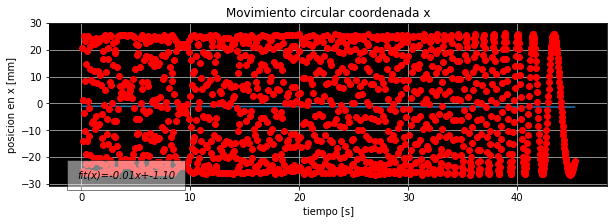

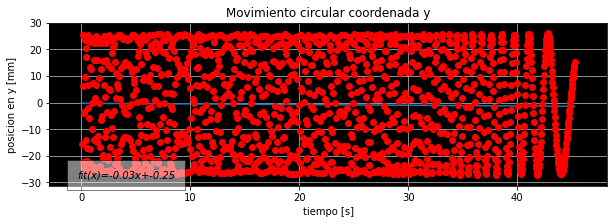

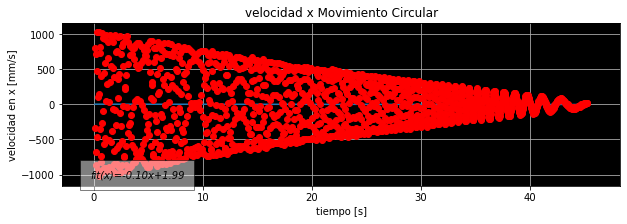

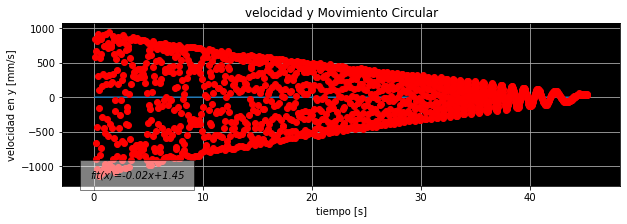

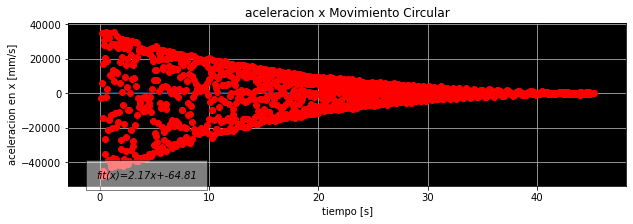

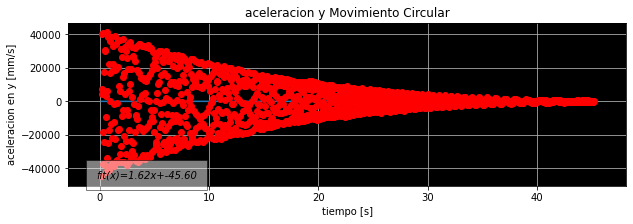

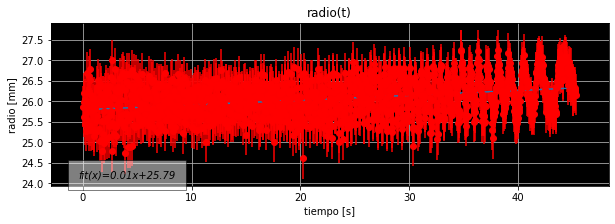

IndexError: list index out of range

In [23]:
import csv
plt.rcParams["figure.figsize"] = (10,3)
plt.rcParams['axes.facecolor'] = 'black'


datt=[];
with open('./lotsadataspinner', newline = '') as datos:                                                                                          
    filereader = csv.reader(datos, delimiter='\t')
    for dato in filereader:
        datt.append(dato)
datt.pop(0) # quitamos
datt.pop(0) # basura

tiempop=[]
xes=[]
yes=[]
for dato in datt:
    tiempop.append(float(dato[0]))
    xes.append(float(dato[2]))
    yes.append(float(dato[1]))

dt = (tiempop[1]-tiempop[2])*0.01
dx = 0.5
incertx=0.5


## aliasing zone -1 (14 points)
#loindx=2 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 20 ## must be smaller than len(xes)


## aliasing zone 0 (10 points)
#loindx=30 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 50 ## must be smaller than len(xes)


## aliasing zone 0 (5 points)
#loindx=110 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 140 ## must be smaller than len(xes)


##aliasing zone 1 (6 points)
#loindx=260 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 303 ## must be smaller than len(xes)

## zoomed into aliasing zone 2 (7 points)
#loindx=380 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 420#len(xes)-2 ## must be smaller than len(xes)

## aliazone 3 (7 points)
#loindx=383 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 425 ## must be smaller than len(xes)

## aliasing zone 4 (8 points)
#loindx=485 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 520 ## must be smaller than len(xes)

## aliasing zone 5 (9 points)
#loindx=580 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 600 ## must be smaller than len(xes)

## aliasing zone 6 (10 points)
#loindx=645 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 675 ## must be smaller than len(xes)

## after aliasing zone 
#loindx=800 ## must be greater than 1 for speed and 2 for acceleration
#hindx = 1350 ## must be smaller than len(xes)


## max range
loindx=2 ## must be greater than 1 for speed and 2 for acceleration
hindx = len(xes)-2## must be smaller than len(xes)


graficaDatos(tiempop[loindx:hindx], xes[loindx:hindx], dt, dx,"tiempo [s]", "posicion en x [mm]", "Movimiento circular coordenada x")
graficaDatos(tiempop[loindx:hindx], yes[loindx:hindx], dt, dx,"tiempo [s]", "posicion en y [mm]", "Movimiento circular coordenada y")

vxi=veluncert(tiempop,xes,dt,dx)


vx=velocity(tiempop,xes)

vy=velocity(tiempop,yes)

## begin manual fit
## zoom in for better fit


graficaDatos(tiempop[loindx+1:hindx-1], vx[loindx+1:hindx-1], dt, dx,"tiempo [s]", "velocidad en x [mm/s]", "velocidad x Movimiento Circular")
graficaDatos(tiempop[loindx+1:hindx-1], vy[loindx+1:hindx-1], dt, dx,"tiempo [s]", "velocidad en y [mm/s]", "velocidad y Movimiento Circular")

## end manual fit


ax=velocity(tiempop[1:len(tiempop)-1],vx)

ay=velocity(tiempop[1:len(tiempop)-1],vy)

## begin manual fit
## zoom in for better fit


graficaDatos(tiempop[loindx+2:hindx-2], ax[loindx+2:hindx-2], dt, dx,"tiempo [s]", "aceleracion en x [mm/s]", "aceleracion x Movimiento Circular")
graficaDatos(tiempop[loindx+2:hindx-2], ay[loindx+2:hindx-2], dt, dx,"tiempo [s]", "aceleracion en y [mm/s]", "aceleracion y Movimiento Circular")





## obten radiovs tiempo

radios=[]
for i in range(len(xes)):
    radios.append(np.sqrt(xes[i]**2 + yes[i]**2))

#plt.rcParams['axes.facecolor'] = 'white'

graficaDatos(tiempop[loindx:hindx], radios[loindx:hindx], dt, dx,"tiempo [s]", "radio [mm]", "radio(t)")


## obten theta vs tiempo

## para esto considera que si v=f(x+-dx) entonces v = f(x) + dx*f'(x)
plt.rcParams["figure.figsize"] = (10,3)

angulos=[]
dang=[]

for i in range(len(xes)):
    angulos.append(np.arctan2(xes[i],yes[i]))
    dang.append(2*dx/(1+(yes[i]/xes[i])**2))

    
    
## angulo con incertidumbre    
angincvec=veluncertvec3(tiempop,angulos,dtau,dang)

   

graficaDatos(tiempop[loindx:hindx], angulos[loindx:hindx], dt, dx,"tiempo [s]", "angulo [rad]", "angulo(t)")
graficaIncertRelativas(tiempop[loindx:hindx], angincvec[0][loindx:hindx],dtau[loindx:hindx],angincvec[1][loindx:hindx], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")


## encontramos el radio y su incertidumbre
avgradius=avgvec(radios)
radiusstddev=stdvec(radios)

perfectcirclex=[]
perfectcircley=[]

plt.rcParams['axes.facecolor'] = 'black'



## angle unwinding code

teta=[]
indx=1
for i in range(len(angulos)):
    if angulos[i]-angulos[i-1] < 0: ## if next datum is smaller than current
        indx +=2                    ## weve gone around the circle
    teta.append(angulos[i] + indx * np.pi)



## y hacemos un modelo cuyo radio no cambie con el tiempo, que rote con el mismo angulo que nuestro experimento
for i in range(len(xes)):
    perfectcirclex.append(avgradius*np.cos(teta[i]))
    perfectcircley.append(avgradius*np.sin(teta[i]))
    
xes=perfectcirclex
yes=perfectcircley

## hace un vector constante porque dt no cambia
dxes=[]
for i in xes:
    #[loindx+1:hindx-1]:
    dxes.append(dx)
## hace un vector constante porque dt no cambia
dyes=[]
for i in yes:
    #[loindx+1:hindx-1]:
    dyes.append(dx)

graficaIncertRelativas(tiempop[loindx:hindx], xes[loindx:hindx],dtau[loindx:hindx],dxes[loindx:hindx], "tiempo [s]", "posicion eje x [mm/s]", "x(t)")
graficaIncertRelativas(tiempop[loindx:hindx], yes[loindx:hindx],dtau[loindx:hindx],dxes[loindx:hindx], "tiempo [s]", "posicion eje x [mm/s]", "x(t)")




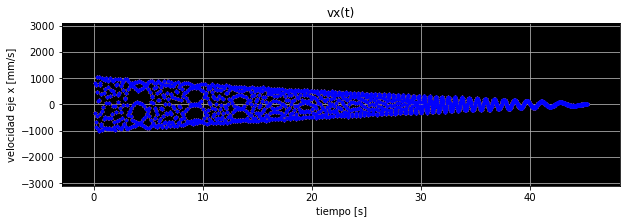

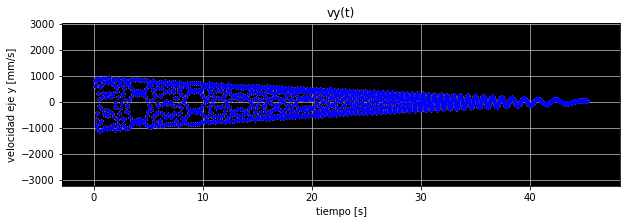

In [25]:
vxi=veluncert(tiempop,xes,dt,dx)

## hace un vector constante porque dt no cambia
dtau=[]
for i in tiempop[loindx+1:hindx-1]:
    dtau.append(dt)
    
graficaIncertRelativas(tiempop[loindx+1:hindx-1], vxi[0][loindx+1:hindx-1],dtau,vxi[1][loindx+1:hindx-1], "tiempo [s]", "velocidad eje x [mm/s]", "vx(t)")




vyi=veluncert(tiempop,yes,dt,dx)

graficaIncertRelativas(tiempop[loindx+1:hindx-1], vyi[0][loindx+1:hindx-1],dtau,vyi[1][loindx+1:hindx-1], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")

#ayi=veluncertvec(tiempop[loindx+1:hindx-1],vyi[0][loindx+1:hindx-1],dtau[loindx+1:hindx-1],vyi[1][loindx+1:hindx-1])

#graficaIncertRelativas(tiempop[loindx+2:hindx-2], ayi[0][loindx+2:hindx-2],dtau,ayi[1][loindx+2:hindx-2], "tiempo [s]", "aceleración eje y [mm/s]", "ay(t)")


In [26]:
## diferencias finitas centradas (se usa en interior de un datavec)
## come incertidumbres vectoriales
def veluncertvec3(xes,yes,ix,iy):
    vels = []
    dvels=[]
    
    for i in range(len(ix)):
        if ix[i] == 0:
            ix[i] += 0.000000000000000000000000001
        if iy[i] == 0:
            iy[i] +=0.000000000000000000000000001
        if yes[i] == 0:
            yes[i] +=0.000000000000000000000000001
        if xes[i] == 0:
            xes[i] +=0.000000000000000000000000001
    
    # derivada para adelante en el primer punto
    if xes[1]-xes[0] != 0:
            # este if es para evitar la division por cero
            ## abajo definimos el diferencial y la aproximacion a la velocidad
            dt= xes[1]-xes[0]
            dx = yes[1]-yes[0]
            v = dx/(dt)
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[0])/abs(xes[0]) # transformamos a incertidumbre relativa dividiendo por la medida
            ## son dos veces la incertidumbre relativa porque sumamos dos tiempos (t + delta t) - (t) para obtener delta t
            dv += (2*iy[0])/abs(yes[0])
            ## hacmeos lo mismo para la variable dependiente
            dvels.append(dv)
    else:
            v = 0 #arbitrario pero efectivo. Crea discontinuidades en funciones que divergen, pero pues ni modo solo es un punto
            vels.append(v)
            dvels.append(0)
            
            
    # derivada enmedio para el centro
    for i in range(1,len(xes)-2):
        if xes[i]-xes[i-1] != 0:
            # este if es para evitar la division por cero
            ## abajo definimos el diferencial y la aproximacion a la velocidad
            dt= xes[i+1]-xes[i-1]
            dx = yes[i+1]-yes[i-1]
            v = dx/(dt)
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[i])/abs(xes[i]) # transformamos a incertidumbre relativa dividiendo por la medida
            ## son dos veces la incertidumbre relativa porque sumamos dos tiempos (t + delta t) - (t) para obtener delta t
            dv += (2*iy[i])/abs(yes[i])
            ## hacmeos lo mismo para la variable dependiente
            dvels.append(dv)
        else:
            v = 0 #arbitrario pero efectivo. Crea discontinuidades en funciones que divergen, pero pues ni modo solo es un punto
            vels.append(v)
            dvels.append(0)
            
    
    # derivada para atras en el ultimo punto
    fin=len(xes)-1
    if xes[fin]-xes[fin-1] != 0:
            # este if es para evitar la division por cero
            ## abajo definimos el diferencial y la aproximacion a la velocidad
            dt= xes[fin]-xes[fin-1]
            dx = yes[fin]-yes[fin-1]
            v = dx/(dt)
            vels.append(v)
            ## dv es la incertidumbre en la velocidad
            dv = (2*ix[fin])/abs(xes[fin]) # transformamos a incertidumbre relativa dividiendo por la medida
            ## son dos veces la incertidumbre relativa porque sumamos dos tiempos (t + delta t) - (t) para obtener delta t
            dv += (2*iy[fin])/abs(yes[fin])
            ## hacmeos lo mismo para la variable dependiente
            dvels.append(dv)
    else:
            v = 0 #arbitrario pero efectivo. Crea discontinuidades en funciones que divergen, pero pues ni modo solo es un punto
            vels.append(v)
            dvels.append(0)
            
    ## return to absolute unvertainty
    #dvels=np.multiply(dvels,vels)

    return([vels,dvels])

In [27]:
yes[0]

15.52

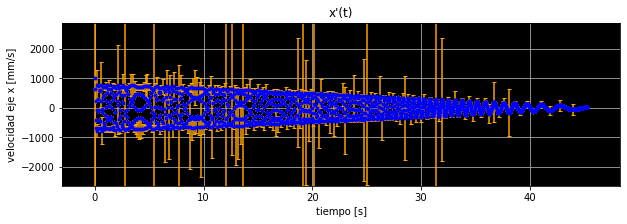

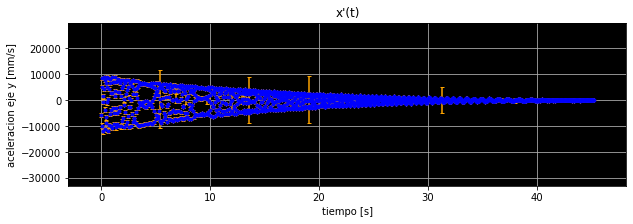

In [28]:
## hace un vector constante porque dt no cambia
dtau=[]
for i in tiempop:
    #[loindx+1:hindx-1]:
    dtau.append(dt)
    
## hace un vector constante porque dt no cambia
dxes=[]
for i in xes:
    #[loindx+1:hindx-1]:
    dxes.append(dx)

vxivect=veluncertvec3(tiempop,xes,dtau,dxes)
vxivect[1]
graficaIncertRelativas(tiempop[0:len(vxivect[0])], vxivect[0],dtau[0:len(vxivect[0])],vxivect[1], "tiempo [s]", "velocidad eje x [mm/s]", "x'(t)")
#len(tiempop[0:len(tiempop)]), len(vxivect[0]), len(dtau), len(dxes), dt,dx
vxivect[1][100]



#####

axinc=acceluncertvec3(tiempop,xes,dtau,dxes)
len(axinc[1])
graficaIncertRelativas(tiempop[0:len(axinc[1])], axinc[0],dtau[0:len(axinc[0])],axinc[1], "tiempo [s]", "aceleracion eje y [mm/s]", "x'(t)")


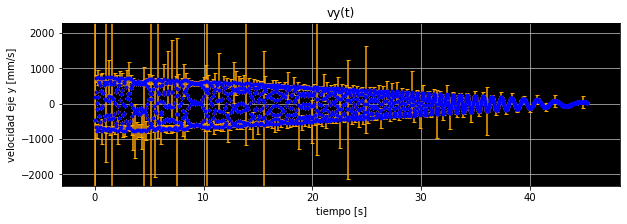

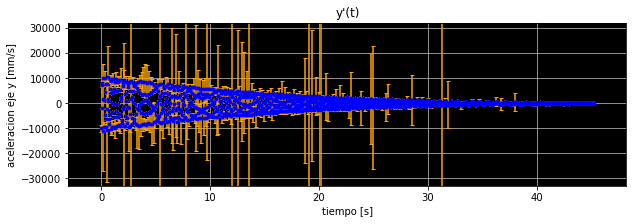

In [29]:
## hace un vector constante porque dt no cambia
dtau=[]
for i in tiempop:
    #[loindx+1:hindx-1]:
    dtau.append(dt)
    
## hace un vector constante porque dt no cambia
dyes=[]
for i in yes:
    #[loindx+1:hindx-1]:
    dyes.append(dx)

## genera las velocidades en y con su incertidumbre
vyivect=veluncertvec3(tiempop,yes,dtau,dyes)
vyivect[1]
graficaIncertRelativas(tiempop[0:len(vyivect[0])], vyivect[0],dtau[0:len(vyivect[0])],vyivect[1], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")
#len(tiempop[0:len(tiempop)]), len(vxivect[0]), len(dtau), len(dxes), dt,dx
#vxivect[0][3]


ayinc=acceluncertvec3(tiempop,yes,dtau,dyes)
len(ayinc[1])
graficaIncertRelativas(tiempop[0:len(ayinc[1])], ayinc[0],dtau[0:len(ayinc[0])],axinc[1], "tiempo [s]", "aceleracion eje y [mm/s]", "y'(t)")


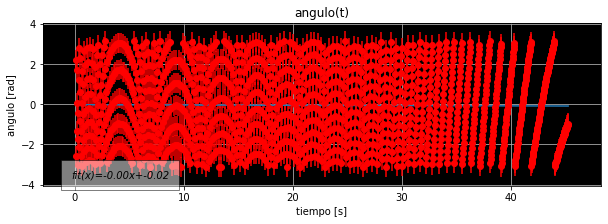

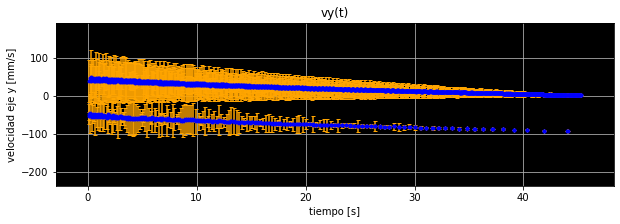

In [30]:
## obten theta vs tiempo

## para esto considera que si v=f(x+-dx) entonces v = f(x) + dx*f'(x)
plt.rcParams["figure.figsize"] = (10,3)

angulos=[]
dang=[]

for i in range(len(xes)):
    angulos.append(np.arctan2(xes[i],yes[i]))
    dang.append(2*dx/(1+(yes[i]/xes[i])**2))

angincvec=veluncertvec3(tiempop,angulos,dtau,dang)

    
graficaDatos(tiempop[loindx:hindx], angulos[loindx:hindx], dt, dx,"tiempo [s]", "angulo [rad]", "angulo(t)")
graficaIncertRelativas(tiempop[loindx:hindx], angincvec[0][loindx:hindx],dtau[loindx:hindx],angincvec[1][loindx:hindx], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")



In [31]:
np.arctan2(0,-1)
type([1.0])

list

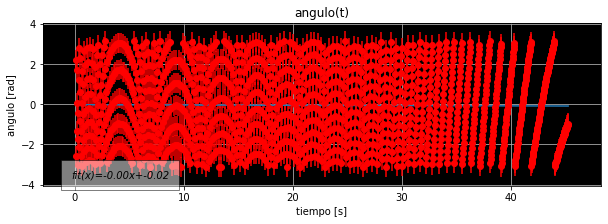

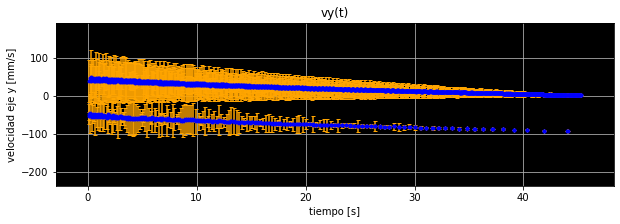

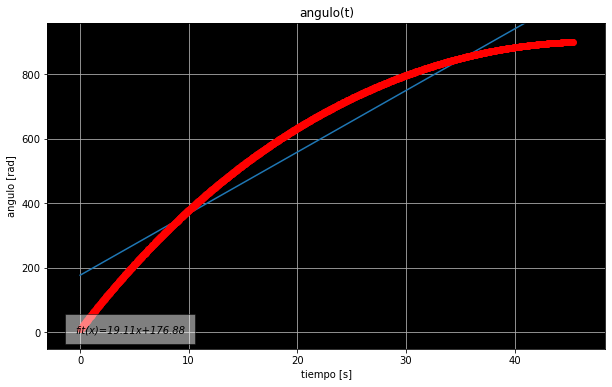

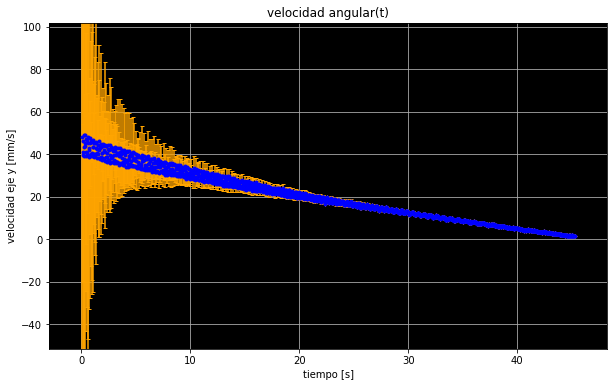

In [32]:
## obten theta vs tiempo

## para esto considera que si v=f(x+-dx) entonces v = f(x) + dx*f'(x)
plt.rcParams["figure.figsize"] = (10,3)

angulos=[]
dang=[]

for i in range(len(xes)):
    angulos.append(np.arctan2(xes[i],yes[i]))
    dang.append(2*dx/(1+(yes[i]/xes[i])**2))

angincvec=veluncertvec3(tiempop,angulos,dtau,dang)

    
graficaDatos(tiempop[loindx:hindx], angulos[loindx:hindx], dt, dx,"tiempo [s]", "angulo [rad]", "angulo(t)")
graficaIncertRelativas(tiempop[loindx:hindx], angincvec[0][loindx:hindx],dtau[loindx:hindx],angincvec[1][loindx:hindx], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")


## angle unwinding code

teta=[]
indx=1
for i in range(len(angulos)):
    if angulos[i]-angulos[i-1] < 0: ## if next datum is smaller than current
        indx +=2                    ## weve gone around the circle
    teta.append(angulos[i] + indx * np.pi)

    plt.rcParams["figure.figsize"] = (10,6)

graficaDatos(tiempop, teta, dt, dx,"tiempo [s]", "angulo [rad]", "angulo(t)")

angincvec2=veluncertvec3(tiempop,teta,dtau,dang)
graficaIncertRelativas(tiempop[loindx:hindx], angincvec2[0][loindx:hindx],dtau[loindx:hindx],np.multiply(angincvec2[1][loindx:hindx], angincvec2[0][loindx:hindx]), "tiempo [s]", "velocidad eje y [mm/s]", "velocidad angular(t)")


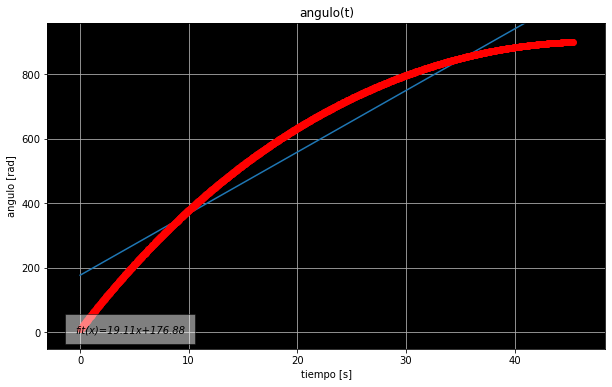

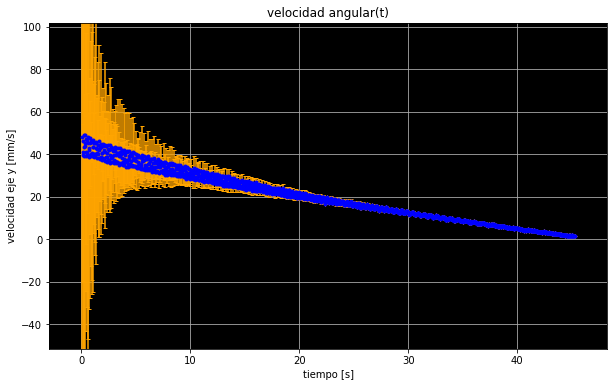

In [33]:
plt.rcParams["figure.figsize"] = (10,6)

graficaDatos(tiempop, teta, dt, dx,"tiempo [s]", "angulo [rad]", "angulo(t)")

angincvec2=veluncertvec3(tiempop,teta,dtau,dang)
graficaIncertRelativas(tiempop[loindx:hindx], angincvec2[0][loindx:hindx],dtau[loindx:hindx],np.multiply(angincvec2[1][loindx:hindx], angincvec2[0][loindx:hindx]), "tiempo [s]", "velocidad eje y [mm/s]", "velocidad angular(t)")


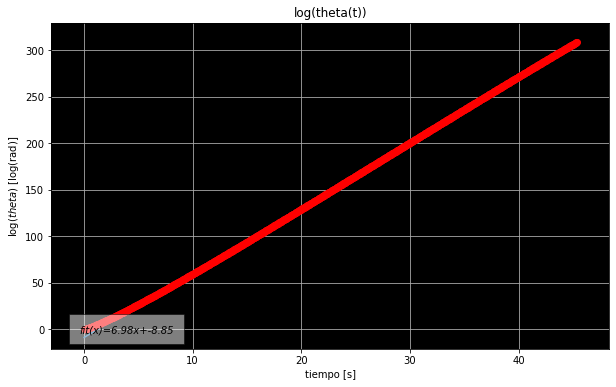

In [34]:
# modela posicion angular con log(teta)
lnteta=[]
for i in teta:
    lnteta.append(np.log(i))
    
graficaDatos(tiempop, np.multiply(lnteta,tiempop), dt, dx,"tiempo [s]", "log($theta$) [log(rad)]", "log(theta(t))")


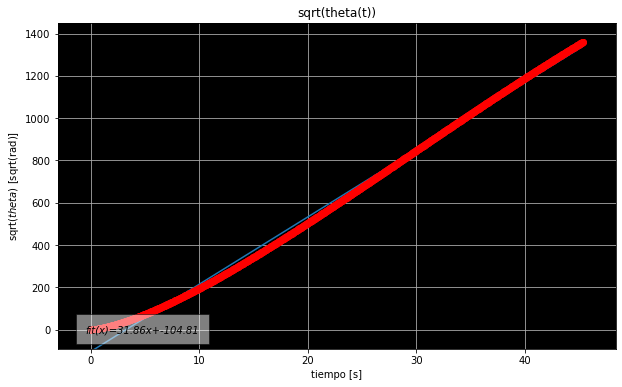

In [35]:
# modela velocidad angular con sqrt
lnteta=[]
for i in teta:
    lnteta.append(np.sqrt(i))
    
graficaDatos(tiempop, np.multiply(lnteta,tiempop), dt, dx,"tiempo [s]",  "sqrt($theta$) [sqrt(rad)]", "sqrt(theta(t))")


In [36]:
## Ukiyo neko systems                                                                                                                       
## usando matplotlib para yegraficar datos bidimensionales                                                                                  
import matplotlib.pyplot as plt
import numpy as np

## aqui van los datos                                                                                                                       

#xes = [2,4,6,8]                                                                                                                            
#yes = [0.9,0.72,0.54,0.5] # 3V                                                                                                             
#yes = [0.24,0.18,0.16,0.13] # 6V                                                                                                           
#yes = [0.42,0.33,0.26,0.22] # 9V                                                                                                           
#yes = [0.57,0.44,0.35,0.30] # 12V                                                                                                          
#yes = [0.74,0.55,0.44,0.38] # 15V                                                                                                          


def graficaExponencial(xes, yes,incertx,incerty, xlabel, ylabel, titulo):

## xes -> variable independiente
## yes -> variable dependiente
## incertx -> incertidumbre var indep
## incerty -> incertidumbre var dep
## xlabel -> lo que dice en la variable independiente
## ylabel -> lo mismo pero para la dependiente
## titulo -> ??


## usamos un poco de automagia para autodeterminar los limites de                                                                           
## la grafica                                                                                                                               
# eje x                                                                                                                                     
    xprincipio=min(xes)
    xfin=max(xes)
    xintervalo = xfin-xprincipio
    xescalar = xintervalo/15 # el numero por que multiplicamos intervalo cambia que tanto                                                   
    #espacio blanco dejamos a las esquinas                                                                                                  
    # eje y                                                                                                                                 
    yprincipio=min(yes)
    yfin= max(yes)
    yintervalo=yfin-yprincipio
    yescalar = yintervalo/15
    
    ## ajustamos los limites de la grafica automagicamente                                                                                  
    plt.axis([xprincipio-xescalar-incertx, xfin+xescalar+incertx, yprincipio-yescalar-incerty, yfin+yescalar+incerty])


    plt.grid(True)
    ## titulo, y esas cosas                                                                                                                 
    plt.title(titulo)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    ## funcion previa
    lnvang=[]
    for i in yes:
        lnvang.append(np.log(i))
    
    ## linea autoajustada
    ajuste = leastSquares([xes,lnvang])
    pendiente = ajuste[0]
    ordenada = ajuste[1]
    
    ## invierte la funcion
    inverselnvang=[]
    for i in range(len(lnvang)):
        inverselnvang.append(np.exp(ajuste[1])*np.exp(ajuste[0]*xes[i]))
    
    plt.plot(xes, inverselnvang, label='y='+str(ajuste[0])+'*x+'+str(ajuste[1]))
 
    ## texto flotante
    posx= xfin+xescalar+incertx-(xprincipio-xescalar-incertx) # toda la graf en x 
    posx *= 0.05 ## la encogemos una proporcion chica
    posx += xprincipio-xescalar-incertx  ## le sumamos el minimo en x
    
    posy= yfin+yescalar+incerty-(yprincipio-yescalar-incerty) # toda la graf en y
    posy *=0.05
    posy += yprincipio-yescalar-incerty
    
    texto = f'fit(x)=exp({ajuste[0]:.2f}x)+exp({ajuste[1]:.2f})'
    plt.text(posx, posy, texto, style='italic',bbox={'facecolor':'white', 'alpha':0.5, 'pad':10})

    
    ## finalmente hacemos la grafica                                                                                                        
    plt.errorbar(xes,yes, xerr=incertx, yerr=incerty, fmt='ro')
    #plt.legend(loc='best')
    plt.show()
    # print (fit)


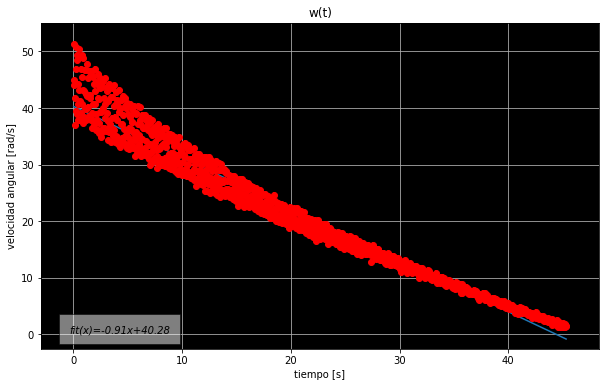

12.071561526796003

In [37]:
## obten velocidad angular

vang=velocity(tiempop,teta)
graficaDatos(tiempop[1:len(tiempop)-1], vang, dt, dx,"tiempo [s]", "velocidad angular [rad/s]", "w(t)")
stdvec(vang)

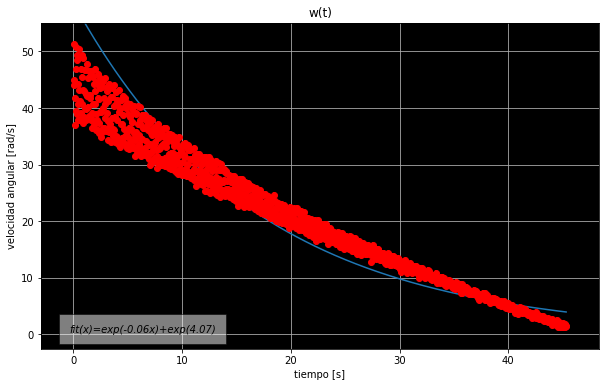

In [38]:
# modela velocidad angular
lnvang=[]
for i in vang:
    lnvang.append(i)
    
graficaExponencial(tiempop[1:len(tiempop)-1], lnvang, dt, dx,"tiempo [s]", "velocidad angular [rad/s]", "w(t)")


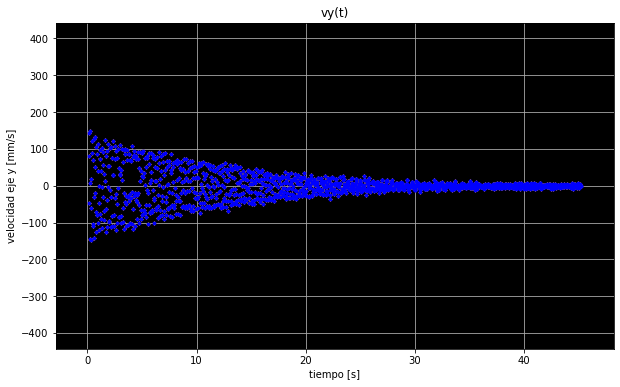

(1363, 1363, 1363, 1363)

In [39]:
accelvec=veluncertvec3(tiempop[loindx:hindx],angincvec2[0][loindx:hindx],dtau[loindx:hindx],angincvec2[1][loindx:hindx])
graficaIncertRelativas(tiempop[loindx+1:hindx-2], accelvec[0][loindx:hindx],dtau[loindx+1:hindx-2],accelvec[1][loindx:hindx], "tiempo [s]", "velocidad eje y [mm/s]", "vy(t)")
len(tiempop[loindx+1:hindx-2]), len(accelvec[0][loindx:hindx]),len(dtau[loindx+1:hindx-2]),len(accelvec[1][loindx:hindx])

In [40]:
len(tiempop[loindx:hindx])

1366

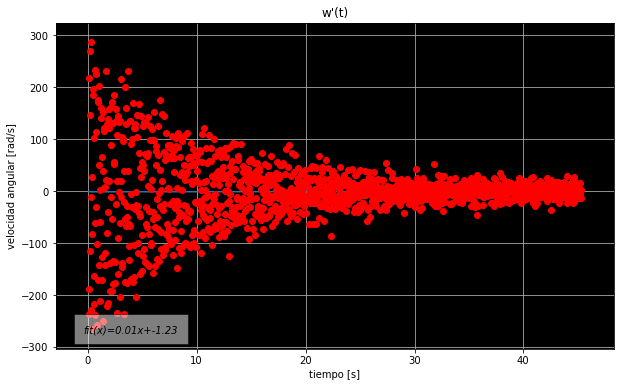

In [41]:
## obten aceleracion angular

aang=velocity(tiempop[1:len(tiempop)-1],vang)
graficaDatos(tiempop[2:len(tiempop)-2], aang, dt, dx,"tiempo [s]", "velocidad angular [rad/s]", "w'(t)")


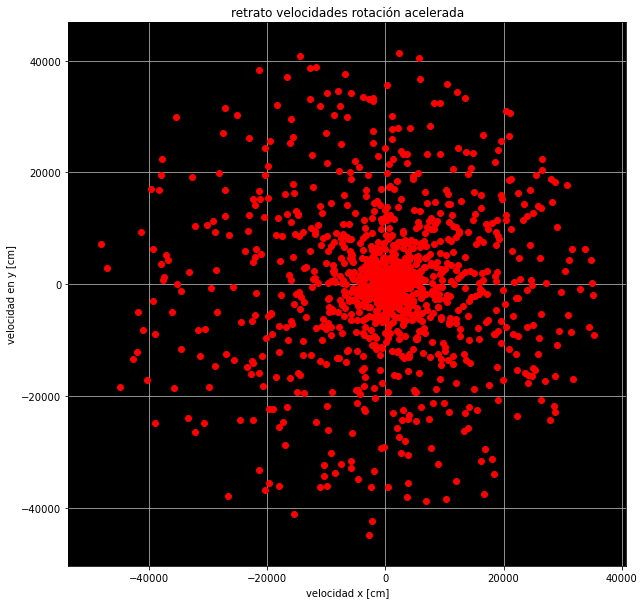

In [42]:
plt.rcParams["figure.figsize"] = (10,10)

graficaEspacio(ax[loindx:hindx], ay[loindx:hindx], dx, dx,"velocidad x [cm]", "velocidad en y [cm]", "retrato velocidades rotación acelerada")


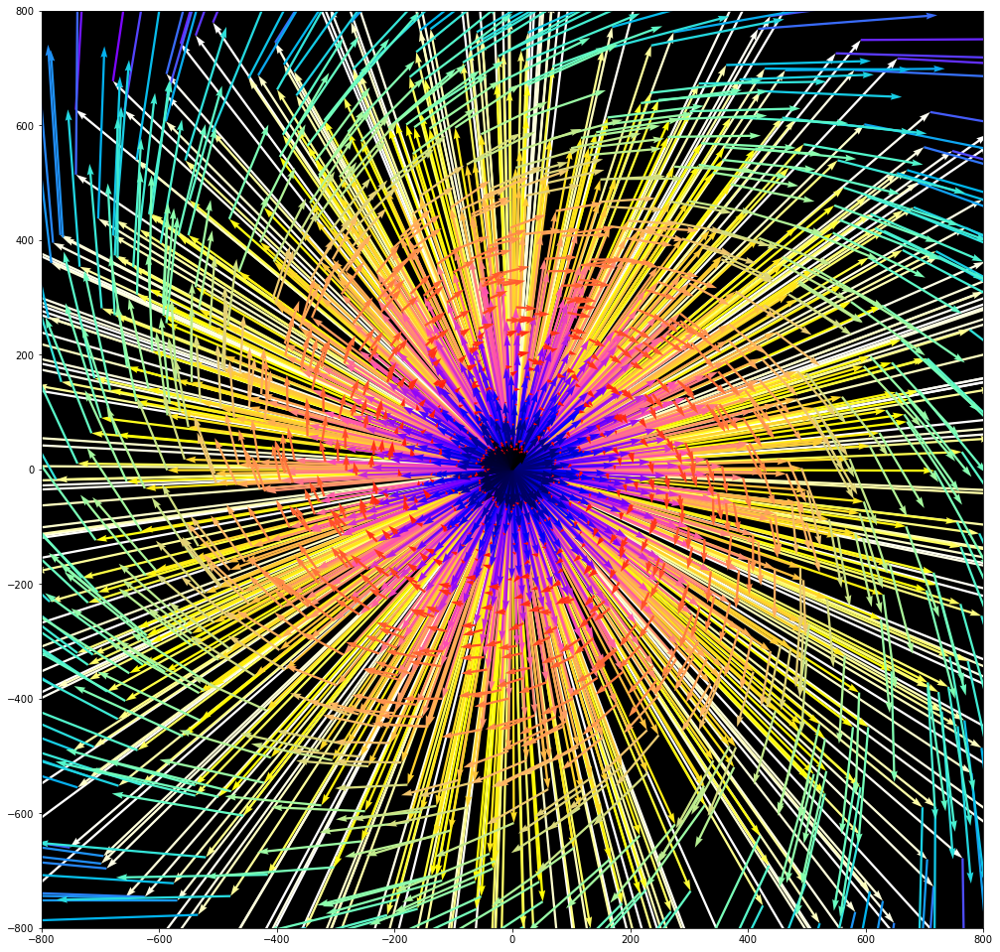

In [43]:
plt.rcParams['axes.facecolor'] = 'black'


##graficamo vector velocidad 
## aprendimos a hacer graficas de vectores, necesitas un vector de xes para tus origenes, uno de yes para lo mismo, y 
## un vector de xes de datos, y uno de yes

##plt.rcParams["figure.figsize"] = (10,10)
plt.figure(figsize=(17, 17))
origin =np.zeros(len(vx))

atet = list(reversed(teta))
plt.quiver(origin, origin, vx,vy, atet[0:len(vx)], angles='xy', scale_units='xy', scale=1,cmap='gnuplot2')
plt.quiver(vx[1:len(vx)-1], vy[1:len(vx)-1], ax,ay, teta[0:len(ax)], angles='xy', scale_units='xy', scale=100,cmap='rainbow')

tamanio=800
plt.axis([-tamanio, tamanio,-tamanio,tamanio])


plt.show()

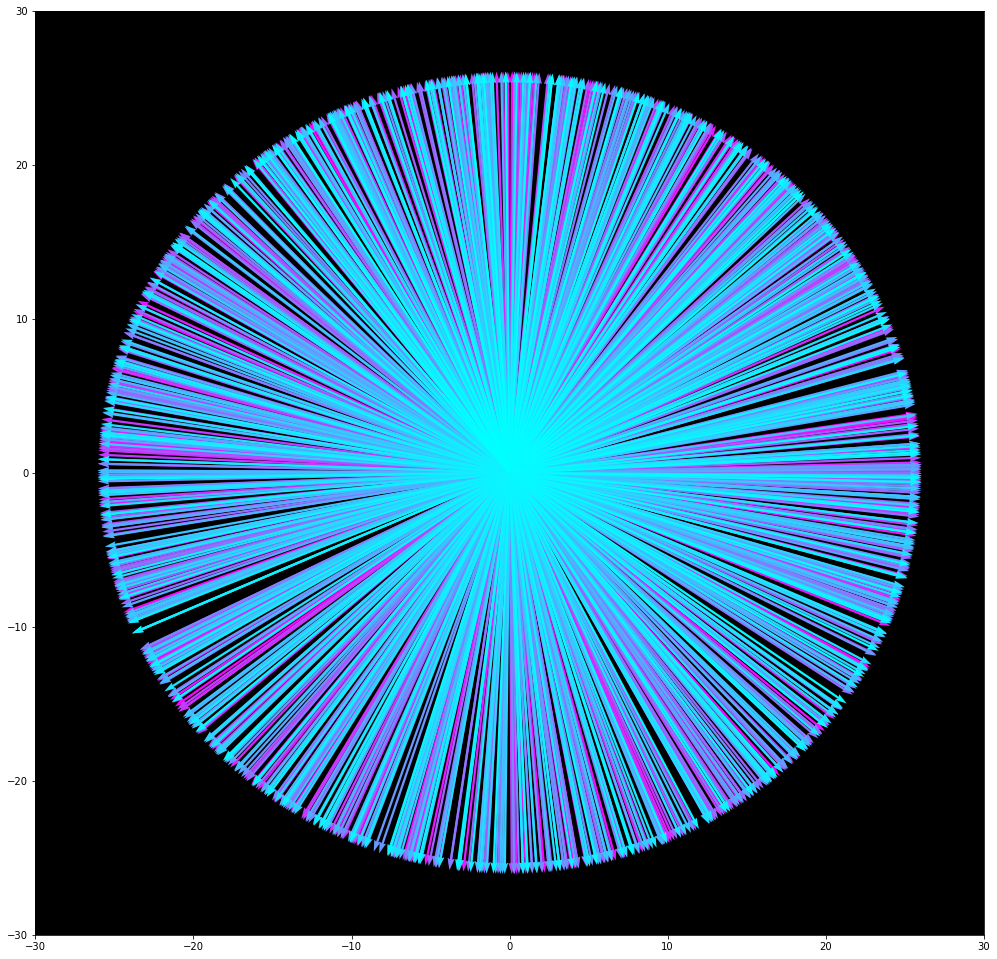

In [64]:
## obten vector velocidad

## aprendimos a hacer graficas de vectores, necesitas un vector de xes para tus origenes, uno de yes para lo mismo, y 
## un vector de xes de datos, y uno de yes

##plt.rcParams["figure.figsize"] = (10,10)
plt.figure(figsize=(17, 17))
origin =np.zeros(len(xes))

atet = list(reversed(teta))
plt.quiver(origin, origin, xes, yes, atet, angles='xy', scale_units='xy', scale=1,cmap='cool')
plt.axis([-30, 30,-30,30])


plt.show()


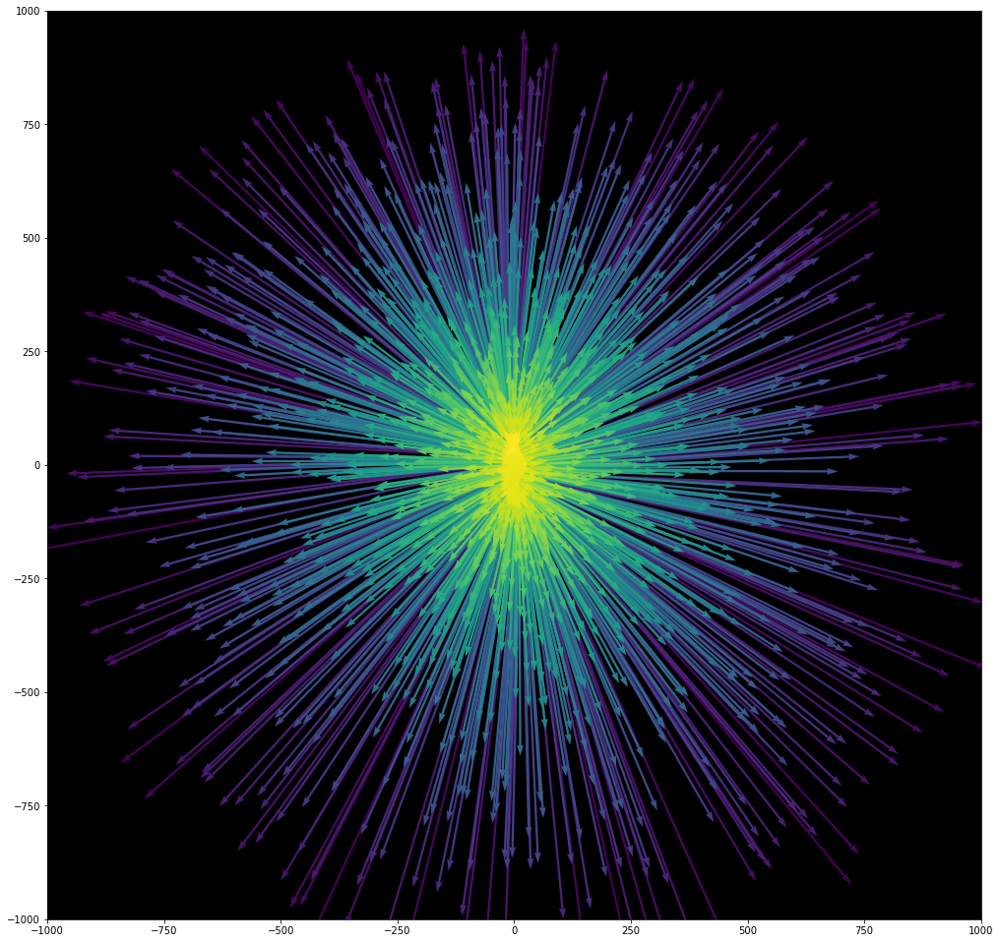

In [65]:

## ahora, teniendo los vectores posicion, queremos dibujar el vector velocidad en cada momento
from matplotlib import cm
from matplotlib.colors import Normalize

plt.rcParams['axes.facecolor'] = 'black'

plt.figure(figsize=(17, 17))
origin =np.zeros(len(xes))

plt.quiver(origin, origin, xes, yes, angulos, angles='xy', scale_units='xy', scale=1,cmap='cool')

#plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, vang, angles='xy', scale_units='xy', scale=1)
plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, teta[1:len(xes)-1], angles='xy', scale_units='xy', scale=1)
plt.axis([-1000, 1000,-1000,1000])



plt.show()

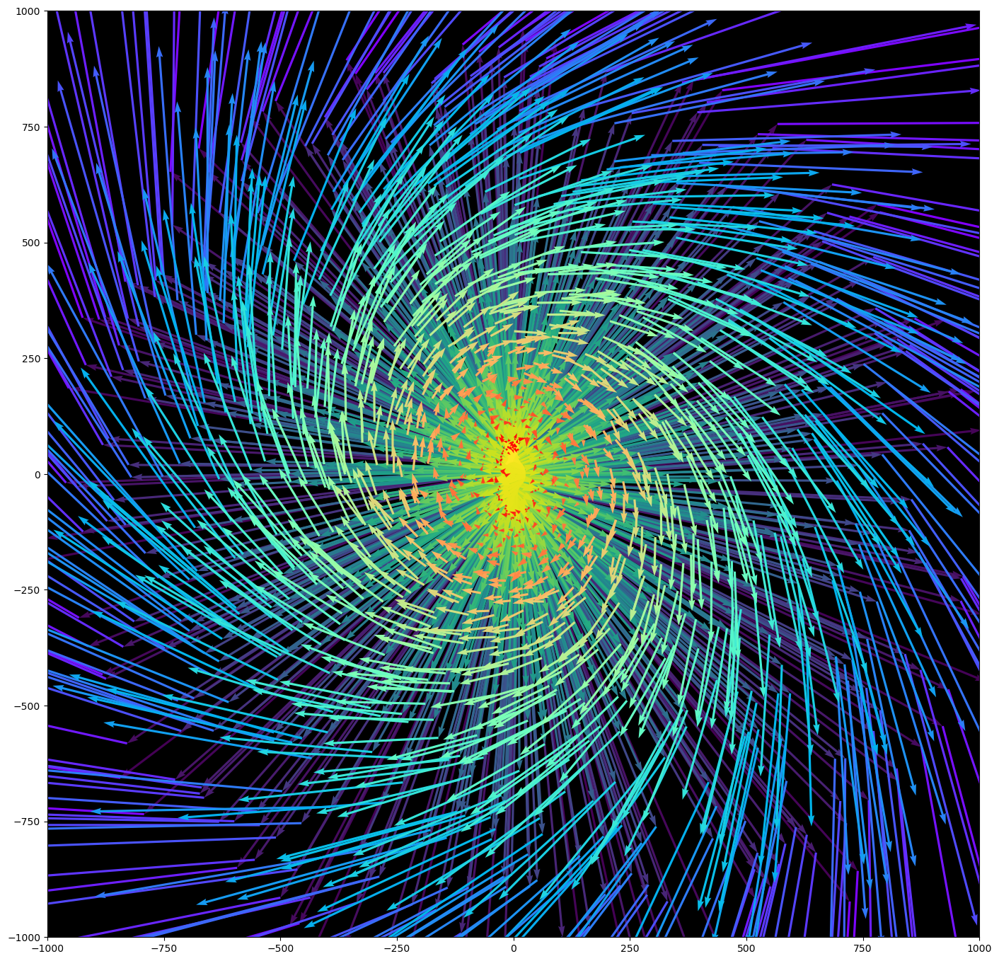

In [66]:

%matplotlib qt 
# stop the rotating heck
%matplotlib inline 

## obten vector aceleracion instantantea
from matplotlib import cm
from matplotlib.colors import Normalize

plt.figure(figsize=(17, 17),facecolor=(1, 1, 1))
origin =np.zeros(len(xes))

plt.quiver(origin, origin, xes, yes, angulos, angles='xy', scale_units='xy', scale=1,cmap='cool')

#plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, vang, angles='xy', scale_units='xy', scale=1)
plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, teta[1:len(xes)-1], angles='xy', scale_units='xy', scale=1)

originsx = np.array(vx[1:len(vx)-1]) + np.array(xes[2:len(xes)-2])
originsy = np.array(vy[1:len(vx)-1]) + np.array(yes[2:len(xes)-2])

#plt.quiver(originsx, originsy, ax, ay, teta[2:len(xes)-2], angles='xy', scale_units='xy', scale=400,cmap='gist_ncar')
plt.quiver(originsx, originsy, ax, ay, teta[2:len(xes)-2], angles='xy', scale_units='xy', scale=50,cmap='rainbow')

tamanio=1000
plt.axis([-tamanio, tamanio,-tamanio,tamanio])



plt.show()

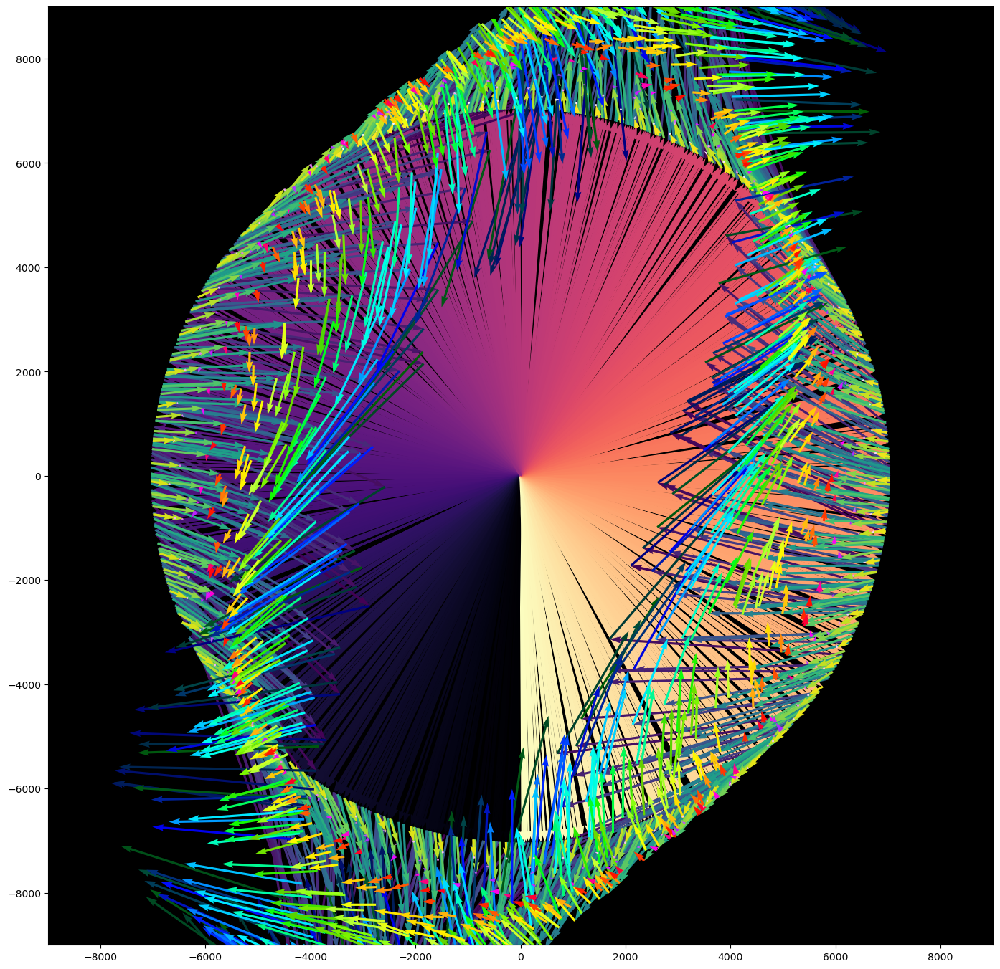

In [67]:
## this instance scales correctly with vector positioning

## obten vector aceleracion instantantea
from matplotlib import cm
from matplotlib.colors import Normalize

plt.figure(figsize=(17, 17))
origin =np.zeros(len(xes))

lolimit=100
hilimit=1366

nt =[]
divi=max(tiempop)
for i in tiempop:
    nt.append(i/divi)

    
scalingfactor0 = 1/270 ## bigger means smaller scale

plt.quiver(origin[lolimit:hilimit], origin[lolimit:hilimit], xes[lolimit:hilimit], yes[lolimit:hilimit], angulos[lolimit:hilimit], angles='xy', scale_units='xy', scale=scalingfactor0,cmap='magma')

#plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, vang, angles='xy', scale_units='xy', scale=1)

scalingfactor = 1/5 ## bigger means smaller scale
originsvx= np.multiply(xes[lolimit:hilimit], 1/scalingfactor0) 
originsvy= np.multiply(yes[lolimit:hilimit], 1/scalingfactor0) 
plt.quiver(originsvx, originsvy, vx[lolimit:hilimit], vy[lolimit:hilimit], teta[lolimit:hilimit], angles='xy', scale_units='xy', scale=scalingfactor)

scalingfactor1 = 10

originsx = np.multiply(np.array(vx[lolimit:hilimit]), 1/scalingfactor) + originsvx
originsy = np.multiply(np.array(vy[lolimit:hilimit]), 1/scalingfactor) + originsvy


plt.quiver(originsx, originsy, ax[lolimit:hilimit], ay[lolimit:hilimit], teta[lolimit:hilimit], angles='xy', scale_units='xy', scale=scalingfactor1,cmap='gist_ncar')

tamanio=9000
plt.axis([-tamanio, tamanio,-tamanio,tamanio])



plt.show()

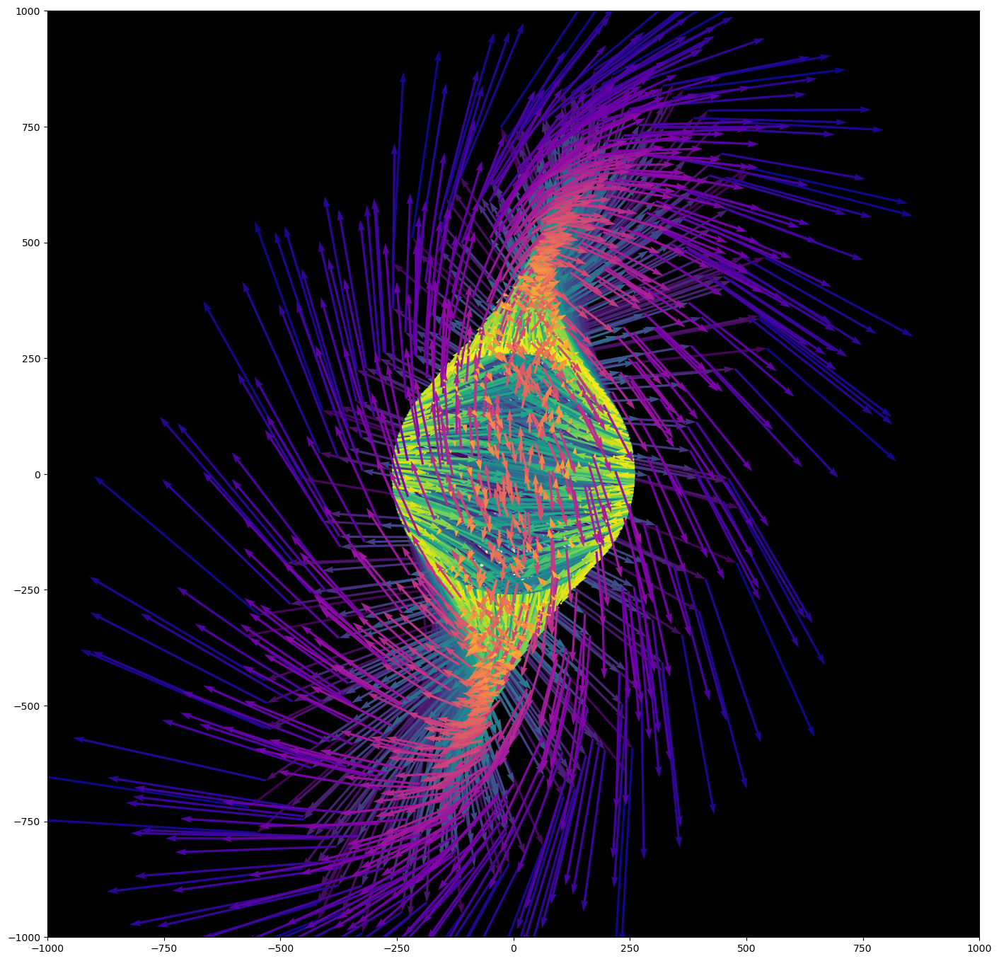

In [68]:
## this one is the best for viewing aliasing

## obten vector aceleracion instantantea
from matplotlib import cm
from matplotlib.colors import Normalize

plt.figure(figsize=(17, 17))
origin =np.zeros(len(xes))

## aliazone
lolimit=loindx
hilimit=hindx

## aliazone2
#lolimit=380
#hilimit=420



nx=np.array(xes[lolimit:hilimit])*10
ny=np.array(yes[lolimit:hilimit])*10
nvx=np.array(vx[lolimit:hilimit])*0.7
nvy=np.array(vy[lolimit:hilimit])*0.7
nax=np.array(ax[lolimit:hilimit])*0.01
nay=np.array(ay[lolimit:hilimit])*0.01

nt =[]
divi=max(tiempop)
for i in tiempop:
    nt.append(i/divi)

plt.quiver(origin[lolimit:hilimit], origin[lolimit:hilimit],nx, ny, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1,cmap='Spectral')

#plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, vang, angles='xy', scale_units='xy', scale=1)
plt.quiver(nx, ny, nvx, nvy, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1)

originsx = nvx + nx # origen de la aceleracion
originsy = nvy + ny # origen de la aceleracion

#plt.quiver(originsx, originsy, nax, nay, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1,cmap='plasma')
plt.quiver(originsx[1:len(originsx)-1], originsy[1:len(originsx)-1], nax, nay, tiempop[lolimit+1:hilimit-1], angles='xy', scale_units='xy', scale=1,cmap='plasma')

tamanio=1000
plt.axis([-tamanio, tamanio,-tamanio,tamanio])



plt.show()

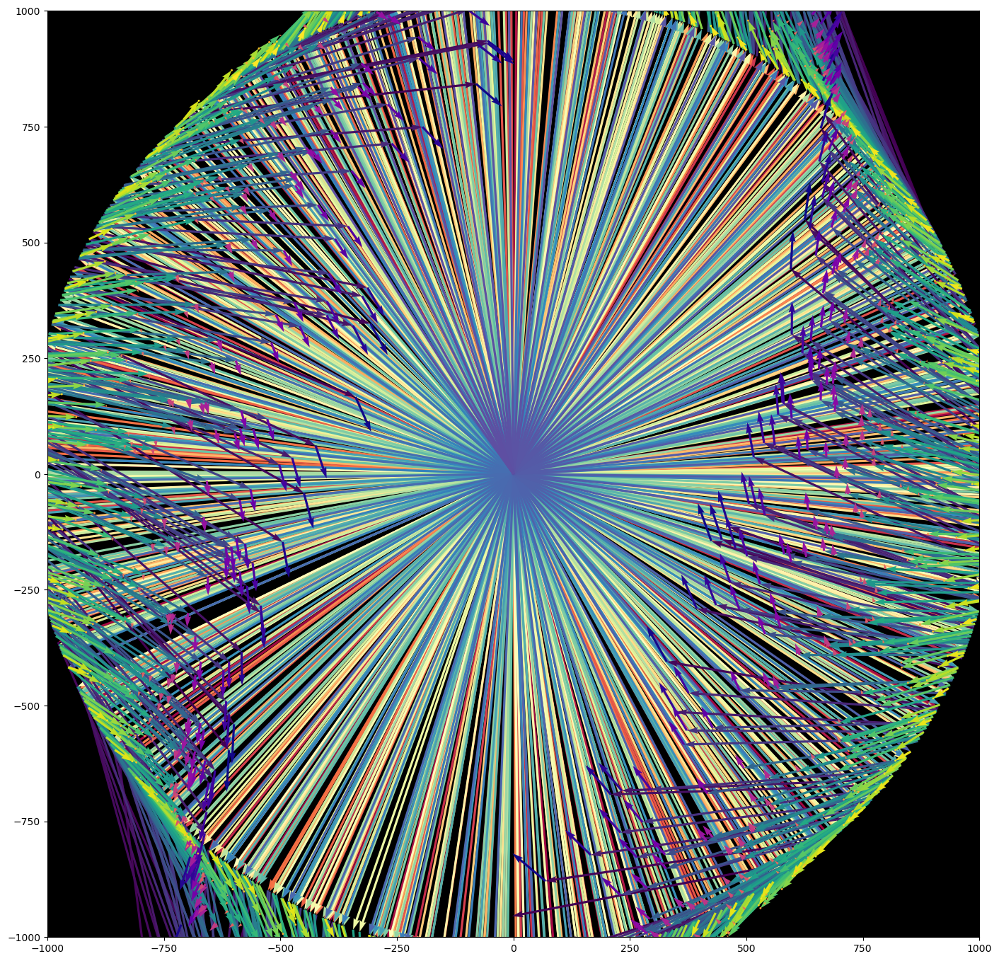

In [69]:
## this one is the best for viewing aliasing

## obten vector aceleracion instantantea
from matplotlib import cm
from matplotlib.colors import Normalize

plt.figure(figsize=(17, 17))
origin =np.zeros(len(xes))

## aliazone
lolimit=loindx
hilimit=hindx

## aliazone2
#lolimit=380
#hilimit=420



nx=np.array(xes[lolimit:hilimit])*40
ny=np.array(yes[lolimit:hilimit])*40
nvx=np.array(vx[lolimit:hilimit])*0.6
nvy=np.array(vy[lolimit:hilimit])*0.6
nax=np.array(ax[lolimit:hilimit])*0.002
nay=np.array(ay[lolimit:hilimit])*0.002

nt =[]
divi=max(tiempop)
for i in tiempop:
    nt.append(i/divi) ## porque hice esto?

plt.quiver(origin[lolimit:hilimit], origin[lolimit:hilimit],nx, ny, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1,cmap='Spectral')

#plt.quiver(xes[1:len(xes)-1], yes[1:len(yes)-1], vx, vy, vang, angles='xy', scale_units='xy', scale=1)
plt.quiver(nx, ny, nvx, nvy, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1)

originsx = nvx + nx # origen de la aceleracion
originsy = nvy + ny # origen de la aceleracion

#plt.quiver(originsx, originsy, nax, nay, tiempop[lolimit:hilimit], angles='xy', scale_units='xy', scale=1,cmap='plasma')
plt.quiver(originsx[1:len(originsx)-1], originsy[1:len(originsx)-1], nax, nay, tiempop[lolimit+1:hilimit-1], angles='xy', scale_units='xy', scale=1,cmap='plasma')

tamanio=1000
plt.axis([-tamanio, tamanio,-tamanio,tamanio])



plt.show()

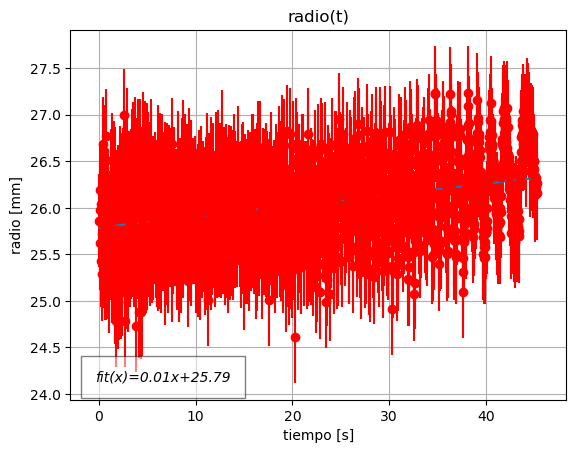

In [46]:
## obten radiovs tiempo

radios=[]
for i in range(len(xes)):
    radios.append(np.sqrt(xes[i]**2 + yes[i]**2))

plt.rcParams['axes.facecolor'] = 'white'

graficaDatos(tiempop[loindx:hindx], radios[loindx:hindx], dt, dx,"tiempo [s]", "radio [mm]", "radio(t)")


In [312]:
for i in range(len(xes)):
    print(tiempop[i],"&",xes[i], "&", yes[i],"&", round(radios[i],2),"\\\\")

1e-27 & -15.567117977218675 & 20.89323888308409 & 26.05 \\
0.033 & -22.56467665042702 & -13.026816986660075 & 26.05 \\
0.066 & 15.645887551595019 & -20.834317744171656 & 26.05 \\
0.099 & 22.087878652039606 & 13.819848399857177 & 26.05 \\
0.133 & -6.337195956133204 & 25.272564977774433 & 26.05 \\
0.166 & -26.014430655157852 & -1.4532690150985088 & 26.05 \\
0.199 & 4.126830069621781 & -25.726093110278665 & 26.05 \\
0.232 & 25.808946258255656 & 3.572238259233751 & 26.05 \\
0.265 & 3.4422213150820995 & 25.8266084796331 & 26.05 \\
0.298 & -23.83476374730624 & 10.524572687399624 & 26.05 \\
0.331 & -9.816782742111096 & -24.134899414260083 & 26.05 \\
0.364 & 24.682317365022456 & -8.345406079668793 & 26.05 \\
0.397 & 13.746753354101303 & 22.1334444984003 & 26.05 \\
0.431 & -17.380194779086303 & 19.41111595409401 & 26.05 \\
0.464 & -21.176163904636738 & -15.180009072007241 & 26.05 \\
0.497 & 17.077583627124522 & -19.677874138250566 & 26.05 \\
0.53 & 21.917543804895892 & 14.088430242675427 & 26.0

7.187 & 8.1815017472862 & -24.737130437894667 & 26.05 \\
7.22 & 25.953523550483983 & -2.297217546671449 & 26.05 \\
7.253 & 14.459550714181796 & 21.67450083130559 & 26.05 \\
7.286 & -10.494019204003365 & 23.848231676337566 & 26.05 \\
7.319 & -26.01395840807217 & 1.4616980144178446 & 26.05 \\
7.352 & -10.889191661137259 & -23.670405533266234 & 26.05 \\
7.386 & 18.836853752166228 & -18.000987024654034 & 26.05 \\
7.419 & 24.571192409406056 & 8.667127362754524 & 26.05 \\
7.452 & 5.430168222460557 & 25.482854357744962 & 26.05 \\
7.485 & -18.981186739970738 & 17.848729452950455 & 26.05 \\
7.518 & -24.30559094227437 & -9.386204882117797 & 26.05 \\
7.551 & 0.28982216405085287 & -26.053379747270544 & 26.05 \\
7.584 & 24.263162748230087 & -9.49534236324113 & 26.05 \\
7.617 & 19.86553737649682 & 16.858915086246494 & 26.05 \\
7.651 & -3.431721080616308 & 25.82800579926982 & 26.05 \\
7.684 & -23.996694066839083 & 10.149939261138062 & 26.05 \\
7.717 & -18.996713671359696 & -17.832202971888737 & 26.05

21.627 & 26.028853702561687 & -1.166776787951617 & 26.05 \\
21.66 & 22.410754573329793 & 13.289871052656594 & 26.05 \\
21.693 & 10.844211020011528 & 23.6910464204459 & 26.05 \\
21.726 & -4.940383561433977 & 25.582322087882773 & 26.05 \\
21.759 & -18.627383561088692 & 18.217661068598915 & 26.05 \\
21.793 & -25.754772694970207 & 3.943891044727158 & 26.05 \\
21.826 & -22.647192914207665 & -12.88282757196277 & 26.05 \\
21.859 & -9.97613469613722 & -24.06946882809816 & 26.05 \\
21.892 & 7.082128909239797 & -25.074011311618488 & 26.05 \\
21.925 & 20.78927217358838 & -15.705691822862368 & 26.05 \\
21.958 & 26.03996376714322 & -0.8848051469844608 & 26.05 \\
21.991 & 22.087878652039667 & 13.819848399857078 & 26.05 \\
22.024 & 11.078288756626378 & 23.58249586806001 & 26.05 \\
22.058 & -3.823253407281782 & 25.772957271643666 & 26.05 \\
22.091 & -18.059348054347666 & 18.780908950159763 & 26.05 \\
22.124 & -25.601199607146363 & 4.841608391568942 & 26.05 \\
22.157 & -23.383223401814483 & -11.4929307

35.338 & 1.7422547335659 & -25.996675587190552 & 26.05 \\
35.372 & 9.066978210583507 & -24.426471281604837 & 26.05 \\
35.405 & 15.674233254342852 & -20.81300086558194 & 26.05 \\
35.438 & 20.647792084436865 & -15.891232651375041 & 26.05 \\
35.471 & 24.246880019038603 & -9.536844472078199 & 26.05 \\
35.504 & 25.967123431082086 & -2.138011659745959 & 26.05 \\
35.537 & 25.642922556197814 & 4.615529863309659 & 26.05 \\
35.57 & 23.61309672322969 & 11.012913160542995 & 26.05 \\
35.603 & 19.852083321348314 & 16.87475572992113 & 26.05 \\
35.637 & 15.103519176699042 & 21.23078664631497 & 26.05 \\
35.67 & 9.165815917989491 & 24.389555381346998 & 26.05 \\
35.703 & 1.7250435405409212 & 25.997823330530963 & 26.05 \\
35.736 & -4.569307022565047 & 25.651199318468514 & 26.05 \\
35.769 & -11.360256174181002 & 23.44796734898879 & 26.05 \\
35.802 & -16.703402888256935 & 19.996472816345182 & 26.05 \\
35.835 & -21.459983560294816 & 14.77605152718879 & 26.05 \\
35.868 & -24.57530102838365 & 8.655470669269672

In [313]:
vxi=veluncert(tiempop,xes,dt,dx)
vrxi=vxi 
for i in range(len(vxi[1])): ## convierte a incertidumbre absoluta
    vrxi[1][i] *= vrxi[0][i]
    
for i in range(len(vxi[1])):
    print(vxi[0][i],"&",vxi[1][i],"\\\\")

-212.04723252146502 & -26.062085652601002 \\
1157.8958849097587 & 7.145112604835125 \\
195.21185152862387 & 26.398793272457826 \\
-836.0316061227296 & -13.182915881147013 \\
-596.2798393643833 & -18.377433515742638 \\
913.3715371145344 & 12.035599560739614 \\
657.0338238979962 & 17.16235382507038 \\
-677.7795437325319 & -16.74743942837966 \\
-826.5753049208595 & -13.771524204613124 \\
424.78730318773125 & 21.807284239275656 \\
1045.4272759737448 & 9.394484783555416 \\
-331.380727603671 & -23.675415750956862 \\
-915.4984745055184 & -11.640323730187001 \\
-115.02936744092219 & -28.002442954211837 \\
1159.2044706594331 & 7.118940889841647 \\
146.66545993246564 & 27.369721104380965 \\
-859.5125504261911 & -13.112779294506515 \\
-593.5695184835292 & -18.4316399333597 \\
855.9015024862587 & 13.185000253305118 \\
720.9661795754779 & 15.883706711520732 \\
-618.0574067937351 & -17.941882167155644 \\
-839.929539009545 & -13.107250125108822 \\
275.2611083484087 & 24.797808136062105 \\
1110.994661

214.16121112463946 & 26.019806080536526 \\
1.1979690844489599 & 30.279070921343436 \\
-179.46991924434732 & -25.92793686172549 \\
-323.33400320405536 & -23.83635023895086 \\
-396.91256143076106 & -22.36477907441424 \\
-369.7076363069126 & -22.908877576891186 \\
-222.37702497477878 & -25.855489803536535 \\
-51.918545132328994 & -29.264659400382616 \\
171.7244249672441 & 26.868541803687293 \\
350.21987988966777 & 23.298632705236066 \\
435.1109120520719 & 21.600812061988044 \\
348.4359158199302 & 22.648008692907958 \\
220.36763700032907 & 25.89567756302274 \\
20.615419054500958 & 29.89072192194237 \\
-168.82787478213066 & -26.92647280738667 \\
-310.25997239254957 & -24.0978308551784 \\
-363.56217913718586 & -23.031786720288196 \\
-366.096373673493 & -22.98110282955957 \\
-260.35656558613584 & -25.095898991306637 \\
-94.82320650852307 & -28.406566172861822 \\
109.84897653101038 & 27.279402220278403 \\
309.5839654612922 & 24.111350993806145 \\
409.8274365656866 & 22.106481571715737 \\
394.5

In [314]:
## taylor series calculator for square root at some point not zero
import numpy as np
from sympy import *



In [ ]:
## stop right there cowbyo

In [41]:

## dis one breaks all the above ones but its cool.. but if u run it everything before will break if you run it again
## unless you start from de beginning again

%matplotlib qt 
## so we can rotate shit
from mpl_toolkits import mplot3d

import numpy as np
import matplotlib.pyplot as plto


fig = plt.figure()
ax = plt.axes(projection="3d")

tamanio=[]
for i in range(len(vang)):
    tamanio.append(5/(vang[i]))
color=[]
for item in teta[1:len(xes)-1]:
    color.append(-item)
    
ax.scatter(xes[1:len(xes)-1], yes[1:len(xes)-1], tiempop[1:len(xes)-1], c=color, s=tamanio)

ax.set_xlabel('X [mm]')
ax.set_ylabel('Y [mm]')
ax.set_zlabel('$tiempo [s]$', fontsize=30, rotation = 0)
tamanio=100
plt.axis([-tamanio, tamanio,-tamanio,tamanio])
plt.show()

In [38]:
# stop the rotating heck
%matplotlib inline 

In [ ]:
magnitude([1,1])

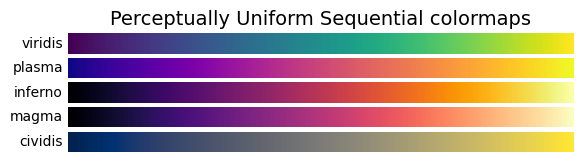

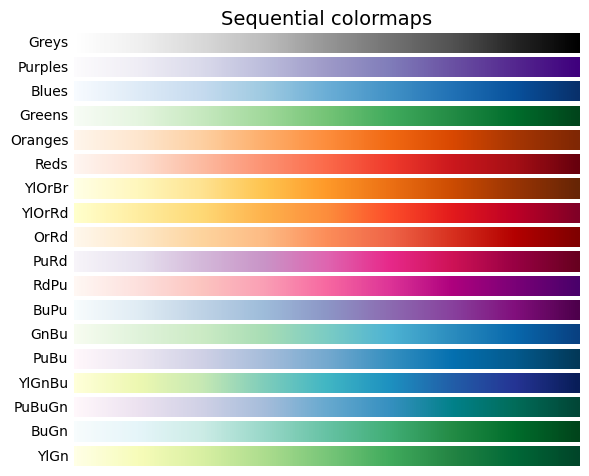

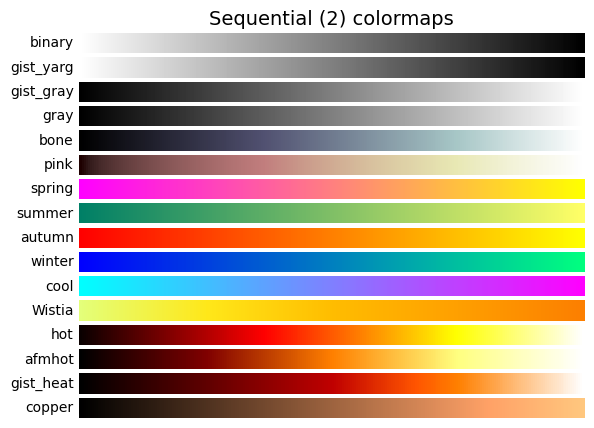

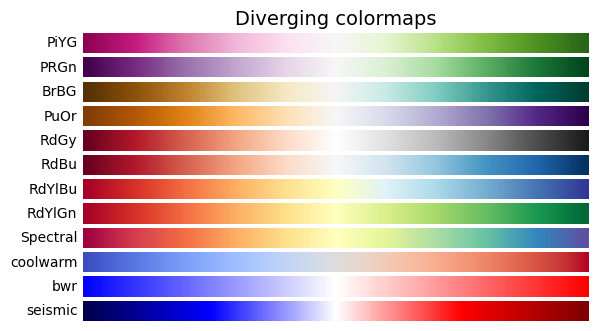

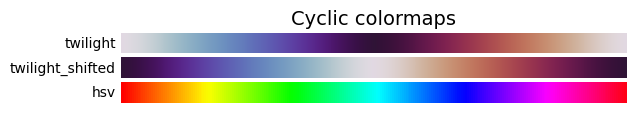

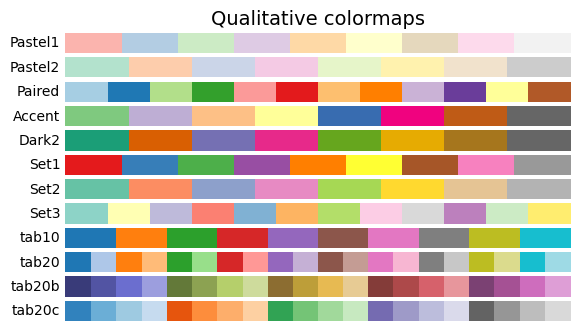

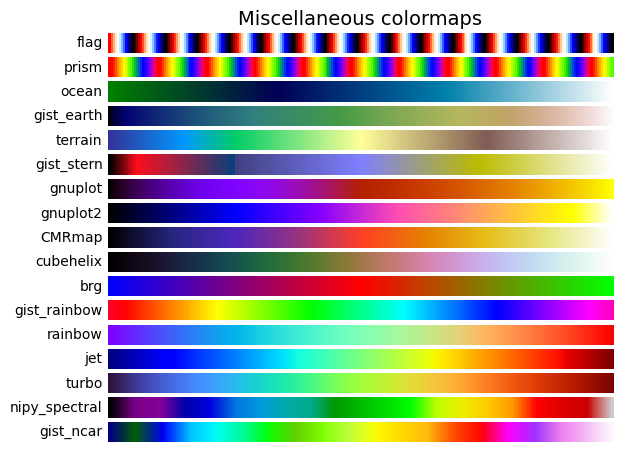

In [102]:
import numpy as np
import matplotlib.pyplot as plt


cmaps = [('Perceptually Uniform Sequential', [
            'viridis', 'plasma', 'inferno', 'magma', 'cividis']),
         ('Sequential', [
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']),
         ('Sequential (2)', [
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink',
            'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia',
            'hot', 'afmhot', 'gist_heat', 'copper']),
         ('Diverging', [
            'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu',
            'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']),
         ('Cyclic', ['twilight', 'twilight_shifted', 'hsv']),
         ('Qualitative', [
            'Pastel1', 'Pastel2', 'Paired', 'Accent',
            'Dark2', 'Set1', 'Set2', 'Set3',
            'tab10', 'tab20', 'tab20b', 'tab20c']),
         ('Miscellaneous', [
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern',
            'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg',
            'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral',
            'gist_ncar'])]


gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradients(cmap_category, cmap_list):
    # Create figure and adjust figure height to number of colormaps
    nrows = len(cmap_list)
    figh = 0.35 + 0.15 + (nrows + (nrows-1)*0.1)*0.22
    fig, axs = plt.subplots(nrows=nrows, figsize=(6.4, figh))
    fig.subplots_adjust(top=1-.35/figh, bottom=.15/figh, left=0.2, right=0.99)

    axs[0].set_title(cmap_category + ' colormaps', fontsize=14)

    for ax, name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(name))
        ax.text(-.01, .5, name, va='center', ha='right', fontsize=10,
                transform=ax.transAxes)

    # Turn off *all* ticks & spines, not just the ones with colormaps.
    for ax in axs:
        ax.set_axis_off()


for cmap_category, cmap_list in cmaps:
    plot_color_gradients(cmap_category, cmap_list)

plt.show()